<a href="https://colab.research.google.com/github/dhaniyapatta/ecog-joystick/blob/main/ECoG_joystick_track.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Loading of Miller ECoG data of the joystick track task

includes some visualizations

In [ ]:
#@title Data retrieval
import os, requests

fname = 'joystick_track.npz'
url = "https://osf.io/6jncm/download"

if not os.path.isfile(fname):
  try:
    r = requests.get(url)
  except requests.ConnectionError:
    print("!!! Failed to download data !!!")
  else:
    if r.status_code != requests.codes.ok:
      print("!!! Failed to download data !!!")
    else:
      with open(fname, "wb") as fid:
        fid.write(r.content)

In [ ]:
# @title Install packages (`nilearn`, `nimare`. `duecredit`), import `matplotlib` and set defaults
# install packages to visualize brains and electrode locations
!pip install nilearn --quiet
!pip install nimare --quiet
!pip install duecredit --quiet

from matplotlib import rcParams
from matplotlib import pyplot as plt

rcParams['figure.figsize'] = [20, 4]
rcParams['font.size'] = 15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True

In [ ]:
# @title Data loading
import numpy as np

alldat = np.load(fname, allow_pickle=True)['dat']

# Select just one of the recordings here. This is subject 1, block 1.
dat = alldat[0][0]

print(dat.keys())

dict_keys(['V', 'targetX', 'targetY', 'cursorX', 'cursorY', 'locs', 'hemisphere', 'lobe', 'gyrus', 'Brodmann_Area'])


In [ ]:
alldat.shape

(1, 4)

In [ ]:
dupl_data = np.load(fname, allow_pickle=True)
lst = dupl_data.files
for item in lst:
    print(item)
    print(dupl_data[item])

dat
[[{'V': array([[ 1.054  ,  0.852  ,  0.0819 , ...,  1.244  ,  0.7847 ,  0.5796 ],
         [-0.103  , -0.285  ,  0.05795, ...,  0.11993, -0.384  , -0.5054 ],
         [-1.679  , -1.829  , -0.01273, ..., -1.452  , -2.006  , -2.027  ],
         ...,
         [-0.1877 , -0.218  , -0.249  , ..., -0.6    , -0.0967 , -0.2834 ],
         [ 0.0585 , -0.01862, -0.363  , ..., -0.4094 ,  0.0865 , -0.10834],
         [ 1.166  ,  1.073  ,  1.076  , ...,  0.667  ,  1.182  ,  0.9375 ]],
        dtype=float16), 'targetX': array([[2569],
         [2569],
         [2569],
         ...,
         [2755],
         [2755],
         [2755]], dtype=uint16), 'targetY': array([[14113],
         [14113],
         [14113],
         ...,
         [13182],
         [13182],
         [13182]], dtype=uint16), 'cursorX': array([[8251],
         [8251],
         [8251],
         ...,
         [ 395],
         [ 395],
         [ 395]], dtype=uint16), 'cursorY': array([[22316],
         [22316],
         [22316],
   

In [ ]:
for i in range(len(alldat[0])):
  print(alldat[0][i].keys())

dict_keys(['V', 'targetX', 'targetY', 'cursorX', 'cursorY', 'locs', 'hemisphere', 'lobe', 'gyrus', 'Brodmann_Area'])
dict_keys(['V', 'targetX', 'targetY', 'cursorX', 'cursorY', 'locs', 'hemisphere', 'lobe', 'gyrus', 'Brodmann_Area'])
dict_keys(['V', 'targetX', 'targetY', 'cursorX', 'cursorY', 'locs', 'hemisphere', 'lobe', 'gyrus', 'Brodmann_Area'])
dict_keys(['V', 'targetX', 'targetY', 'cursorX', 'cursorY', 'locs', 'hemisphere', 'lobe', 'gyrus', 'Brodmann_Area'])


# Dataset info #

This is one of multiple ECoG datasets from Miller 2019, recorded in clinical settings with a variety of tasks. Raw data here:

https://exhibits.stanford.edu/data/catalog/zk881ps0522

`dat` contain 4 sessions from 4 subjects, and was used in these papers:

- Schalk, G., et al. "Decoding two-dimensional movement trajectories using electrocorticographic signals in humans." Journal of Neural Engineering 4.3 (2007): 264. doi: [10.1088/1741-2560/4/3/012](https://doi.org/10.1088/1741-2560/4/3/012)

- Schalk, Gerwin, et al. "Two-dimensional movement control using electrocorticographic signals in humans." Journal of Neural Engineering 5.1 (2008): 75. doi: [10.1088/1741-2560/5/1/008](https://doi.org/10.1088/1741-2560/5/1/008)

<br>

From the dataset readme:

*During the study, each patient was in a semi-recumbent position in a hospital bed about 1 m from a computer monitor. The patient used a joystick to maneuver a white cursor track a green target moving counter-clockwise in a circle of diameter 85% of monitor height ~1m away. The hand used to control the joystick was contralateral to the implanted electrode array.*

<br>

We also know that subject 0 was implanted in the left temporal lobe, while subject 2 was implanted in the right frontal lobe.

Sample rate is always 1000Hz, and the ECoG data has been notch-filtered at 60, 120, 180, 240 and 250Hz, followed by z-scoring across the entire recording and conversion to float16 to minimize size.

Variables are:
* `dat['V']`: continuous voltage data (time by channels)
* `dat['targetX']`: position of the target on the screen
* `dat['targetY']`: position of the target on the screen
* `dat['cursorX']`: X position of the cursor controlled by the joystick
* `dat['cursorY']`: X position of the cursor controlled by the joystick
* `dat['locs`]: three-dimensional coordinates of the electrodes

In [ ]:
from nilearn import plotting
from nimare import utils

plt.figure(figsize=(8, 8))
locs = dat['locs']
view = plotting.view_markers(utils.tal2mni(locs),
                             marker_labels=['%d'%k for k in np.arange(locs.shape[0])],
                             marker_color='purple',
                             marker_size=5)
view

<Figure size 800x800 with 0 Axes>

In [ ]:
# print the shape of target x and target y, cursor x and cursor y

print('targetX: ', dat['targetX'].shape)
print('targetY: ', dat['targetY'].shape)
print('cursorX: ', dat['cursorX'].shape)
print('cursorY: ', dat['cursorY'].shape)


targetX:  (372760, 1)
targetY:  (372760, 1)
cursorX:  (372760, 1)
cursorY:  (372760, 1)


In [ ]:
# compute correlations between voltage data and X/Y position of cursor
from scipy import signal
dat = alldat[0][3]

V = dat['V'].astype('float32')

nt, nchan = V.shape

targetX = dat['targetX'].flatten()
targetY = dat['targetY'].flatten()

cx = np.zeros(nchan, )
cy = np.zeros(nchan, )
for j in range(nchan):
  cx[j] = np.corrcoef(V[:, j], targetX)[0, 1]
  cy[j] = np.corrcoef(V[:, j], targetY)[0, 1]

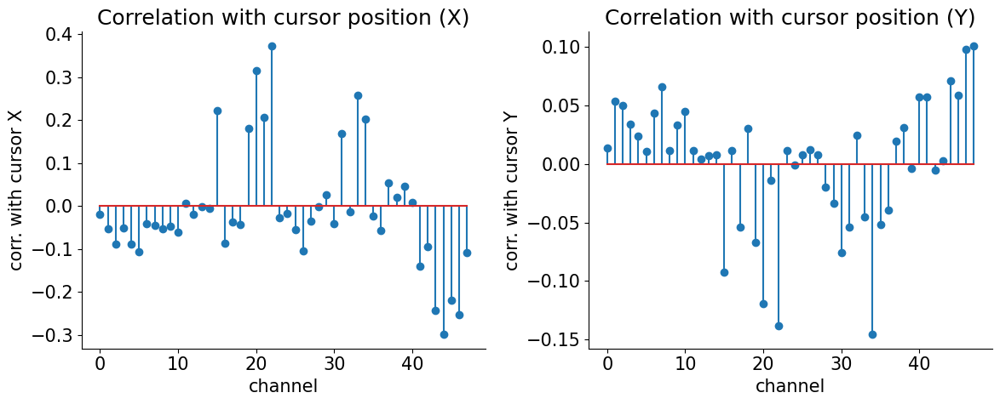

In [ ]:
# prompt: plot cx and cy

import matplotlib.pyplot as plt
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.stem(cx)
plt.xlabel('channel')
plt.ylabel('corr. with cursor X')
plt.title('Correlation with cursor position (X)')

plt.subplot(1, 2, 2)
plt.stem(cy)
plt.xlabel('channel')
plt.ylabel('corr. with cursor Y')
plt.title('Correlation with cursor position (Y)')
plt.show()


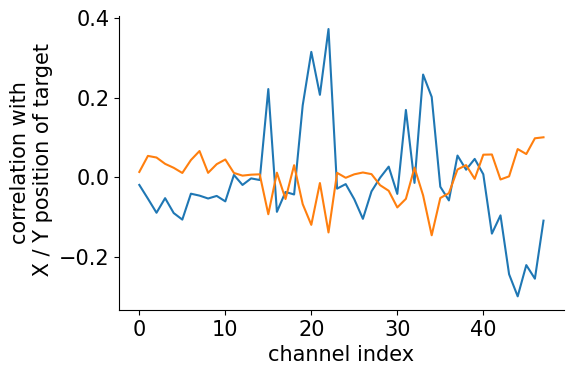

In [ ]:
plt.subplot(1, 4, 1)
plt.plot(cx)
plt.plot(cy)
plt.ylabel('correlation with\n X / Y position of target')
plt.xlabel('channel index')
plt.show()

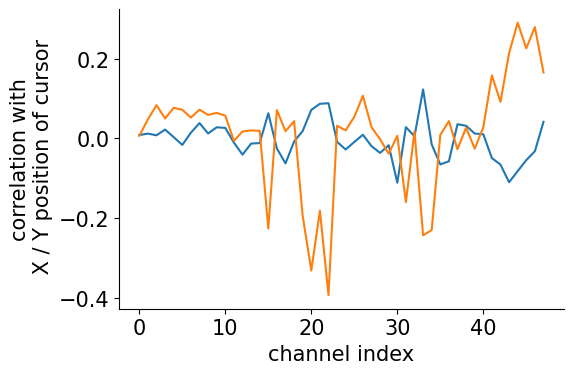

In [ ]:
cursorX = dat['cursorX'].flatten()
cursorY = dat['cursorY'].flatten()

cx = np.zeros(nchan, )
cy = np.zeros(nchan, )
for j in range(nchan):
  cx[j] = np.corrcoef(V[:, j], cursorX)[0, 1]
  cy[j] = np.corrcoef(V[:, j], cursorY)[0, 1]


plt.subplot(1, 4, 1)
plt.plot(cx)
plt.plot(cy)
plt.ylabel('correlation with\n X / Y position of cursor')
plt.xlabel('channel index')
plt.show()

In [ ]:
print("Corr  data with cursorX: ", np.corrcoef(V[:, j], cursorX)[0, 1])
print("Corr  data with cursorY: ", np.corrcoef(V[:, j], cursorY)[0, 1])
print("Corr  data with targetX: ", np.corrcoef(V[:, j], targetX)[0, 1])
print("Corr  data with targetY: ", np.corrcoef(V[:, j], targetY)[0, 1])


Corr  data with cursorX:  0.04113040673337269
Corr  data with cursorY:  0.16504782792080916
Corr  data with targetX:  -0.10860152700553138
Corr  data with targetY:  0.10051298541027773


In [ ]:
# Function to detect the start of movement
def find_movement_start(targetX, targetY, threshold=1e-3):
    for i in range(1, len(targetX)):
        if np.abs(targetX[i] - targetX[0]) > threshold or np.abs(targetY[i] - targetY[0]) > threshold:
            return i
    return 0  # Return 0 if no movement is detected

# Detect the start of movement
movement_start = find_movement_start(targetX, targetY)
print(movement_start)



2120


In [ ]:

def sample_indices(seq, starting_index, k):
  resulted_seq = seq[starting_index::k]
  n = int(len(seq))
  index_list = list((np.arange(n)*k)[:len(resulted_seq)])
  return resulted_seq, index_list


def plot_mvmt_trajectory(xs, ys, spacing_index, title):
  xs_seq_val = sample_indices(xs, 0, spacing_index)[0]
  ys_seq_val = sample_indices(ys, 0, spacing_index)[0]
  indices = sample_indices(ys, 0, spacing_index)[1]
  print('num of sampled pts from sequences', len(indices))

  plt.figure()
  ax = plt.axes(aspect=1)
  ax.scatter(xs_seq_val,ys_seq_val, c=indices, s=2)
  ax.set_xlim(-2000, 34500)
  ax.set_ylim(-2000,34500)
  ax.set_title(title)

def plot_mvmt_trajectories_compare(xs_target, ys_target, xs_cursor, ys_cursor, spacing_index, title):
    # Sample the target trajectory
    xs_target_seq, target_indices = sample_indices(xs_target, 0, spacing_index)
    ys_target_seq = sample_indices(ys_target, 0, spacing_index)[0]

    # Sample the cursor trajectory
    xs_cursor_seq, cursor_indices = sample_indices(xs_cursor, 0, spacing_index)
    ys_cursor_seq = sample_indices(ys_cursor, 0, spacing_index)[0]



    # Create the plot
    plt.figure(figsize=(6, 6))
    ax = plt.axes(aspect=1)
    ax.scatter(xs_target_seq, ys_target_seq, c=target_indices, s=2, label='Target Trajectory', cmap='Blues')
    ax.scatter(xs_cursor_seq, ys_cursor_seq, c=cursor_indices, s=2, label='Cursor Trajectory', cmap='Reds')
    ax.set_xlim(-2000, 34500)
    ax.set_ylim(-2000, 34500)
    ax.set_title(title)
    ax.legend()
    plt.show()


num of sampled pts from sequences 155
num of sampled pts from sequences 1240


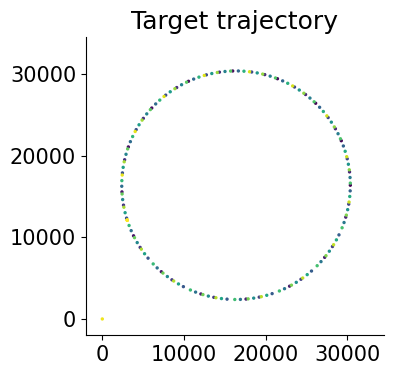

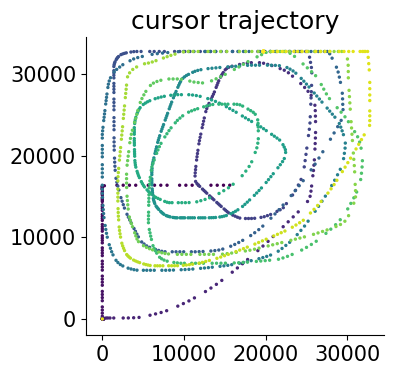

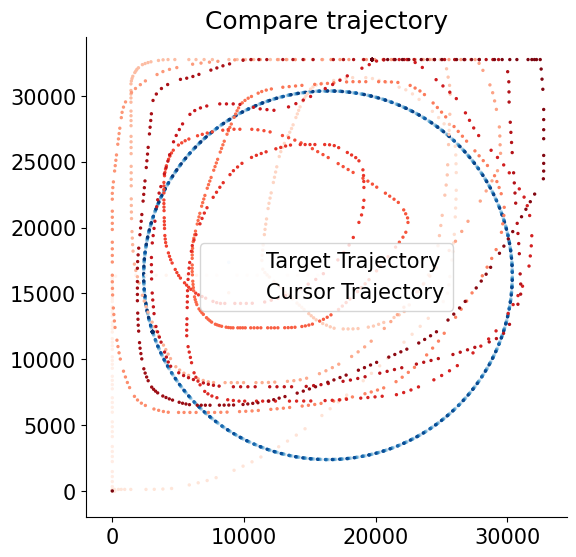

In [ ]:

start_point = 13480 # @param {type:"number"}
end_point = 75480 # @param {type:"number"}

xs_target = targetX[start_point:end_point]
ys_target = targetY[start_point:end_point]
plot_mvmt_trajectory(xs_target, ys_target, spacing_index=400, title = 'Target trajectory')


xs_cursor = cursorX[start_point:end_point]
ys_cursor = cursorY[start_point:end_point]
plot_mvmt_trajectory(xs_cursor, ys_cursor, spacing_index=50, title = 'cursor trajectory')


plot_mvmt_trajectories_compare(xs_target, ys_target, xs_cursor, ys_cursor, spacing_index=50, title = 'Compare trajectory')


/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:187: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(x, axis, dtype, out, keepdims=keepdims, where=where)


Mean voltage per channel: [ 6.0e-08 -2.4e-07 -3.0e-07 -3.6e-07 -6.0e-07 -3.6e-07 -3.0e-07  6.0e-08
 -1.2e-07  0.0e+00  2.4e-07 -2.4e-07  6.6e-07  9.5e-07 -1.8e-07  3.6e-07
 -1.8e-07 -1.2e-07  2.4e-07  5.4e-07  3.0e-07  8.3e-07 -6.0e-07  6.0e-08
 -6.0e-08  3.0e-07 -1.2e-07  1.2e-07 -1.8e-07 -6.0e-07  3.0e-07 -1.2e-07
  4.8e-07  5.4e-07 -1.2e-07  4.8e-07 -5.4e-07 -7.2e-07 -3.0e-07  0.0e+00
  1.8e-07  3.0e-07  3.0e-07  5.4e-07  4.8e-07  2.4e-07 -3.0e-07  1.2e-07]
Standard deviation of voltage per channel: [   inf    inf    inf    inf 0.414  0.3906    inf 0.4329 0.4304 0.385
 0.501  0.4006 0.4385 0.3823 0.399  0.4604 0.3682 0.3904 0.4736 0.3718
 0.4592 0.3555 0.4546 0.3682 0.3557 0.3582 0.3567 0.4834 0.3716 0.3623
 0.3638 0.3994 0.47      inf    inf 0.3823 0.3613 0.3574 0.3723 0.3938
 0.3616 0.3855 0.4026 0.362  0.3586 0.373  0.415     inf]
Maximum voltage per channel: [4.562 4.176 3.834 3.887 4.117 4.223 4.266 4.207 4.69  4.95  4.094 4.31
 3.346 4.11  3.854 6.527 4.918 4.36  4.125 5.598 5

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


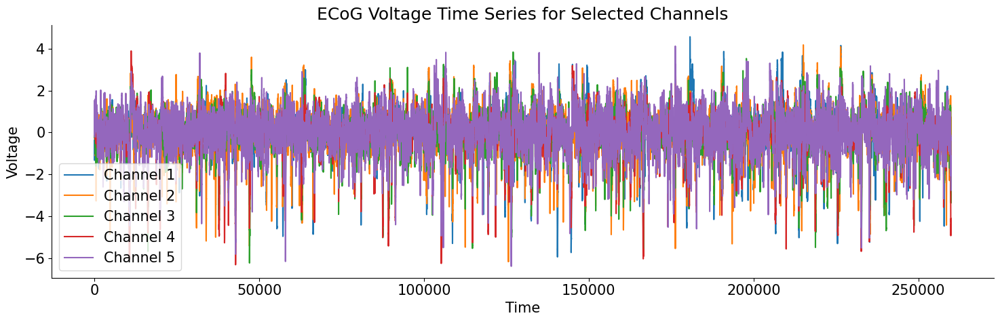

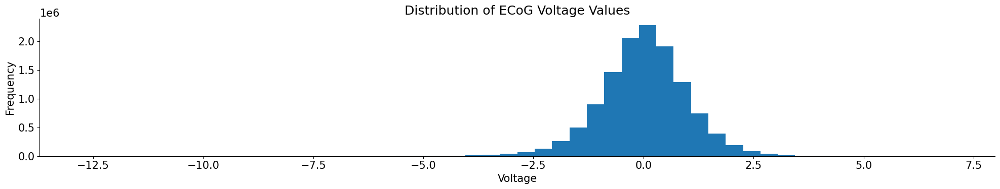

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  fig.canvas.print_figure(bytes_io, **kw)


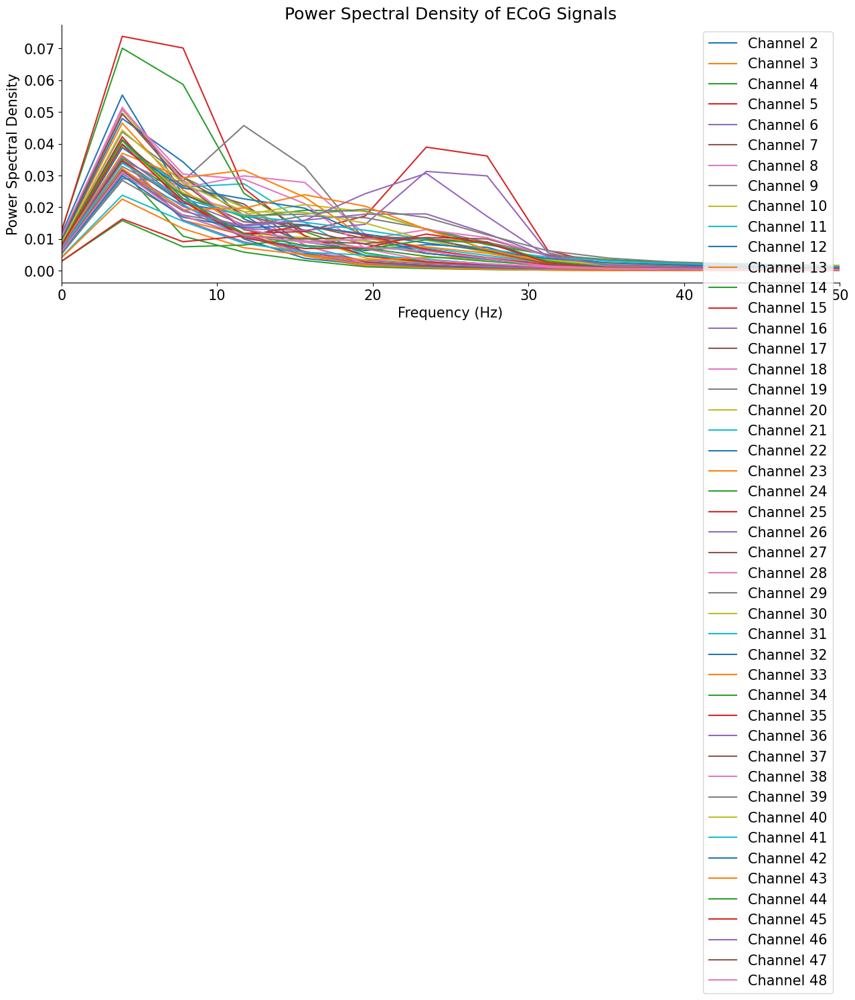

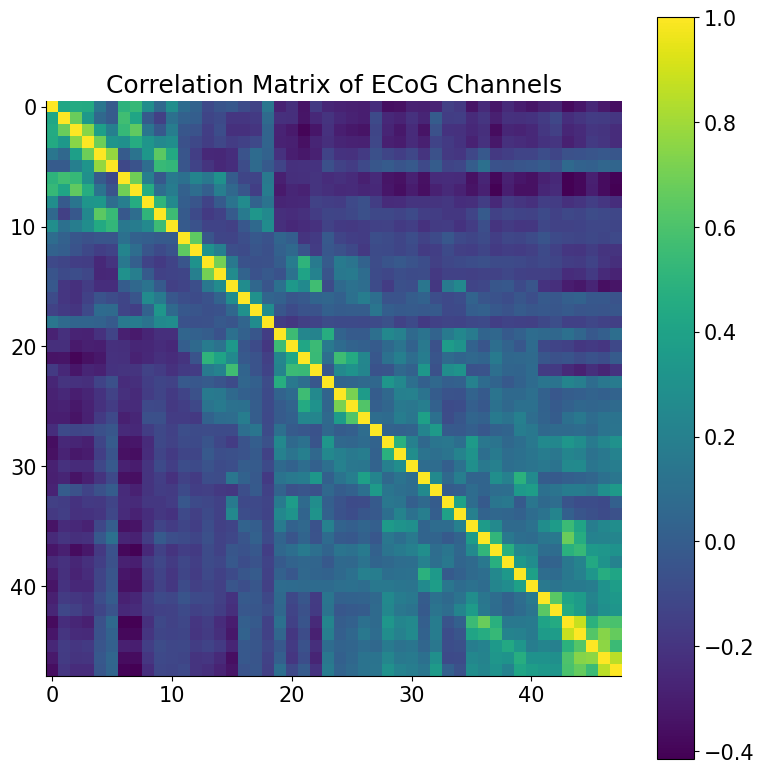

In [ ]:
#basic EDA

import matplotlib.pyplot as plt
import numpy as np
# Basic statistics
mean_voltage = np.mean(dat['V'], axis=0)
std_voltage = np.std(dat['V'], axis=0)
max_voltage = np.max(dat['V'], axis=0)
min_voltage = np.min(dat['V'], axis=0)

print("Mean voltage per channel:", mean_voltage)
print("Standard deviation of voltage per channel:", std_voltage)
print("Maximum voltage per channel:", max_voltage)
print("Minimum voltage per channel:", min_voltage)

# Time series visualization for a few channels
plt.figure(figsize=(15, 5))
for i in range(5):  # Plot first 5 channels
    plt.plot(dat['V'][:, i], label=f"Channel {i+1}")
plt.xlabel("Time")
plt.ylabel("Voltage")
plt.title("ECoG Voltage Time Series for Selected Channels")
plt.legend()
plt.show()

# Distribution of voltage values
plt.figure()
plt.hist(dat['V'].flatten(), bins=50)
plt.xlabel("Voltage")
plt.ylabel("Frequency")
plt.title("Distribution of ECoG Voltage Values")
plt.show()

# Power spectral density (PSD) for a few channels
from scipy import signal
plt.figure(figsize=(15, 5))
for i in range(1,48):
    f, Pxx_den = signal.welch(dat['V'][:, i], fs=1000)  # Assuming sampling rate is 1000 Hz
    plt.plot(f, Pxx_den, label=f"Channel {i+1}")
plt.xlim(0, 50)
plt.xlabel("Frequency (Hz)")
plt.ylabel("Power Spectral Density")
plt.title("Power Spectral Density of ECoG Signals")
plt.legend()
plt.show()

# Correlation matrix between channels
corr_matrix = np.corrcoef(dat['V'], rowvar=False)
plt.figure(figsize=(8, 8))
plt.imshow(corr_matrix, cmap='viridis')
plt.colorbar()
plt.title("Correlation Matrix of ECoG Channels")
plt.show()


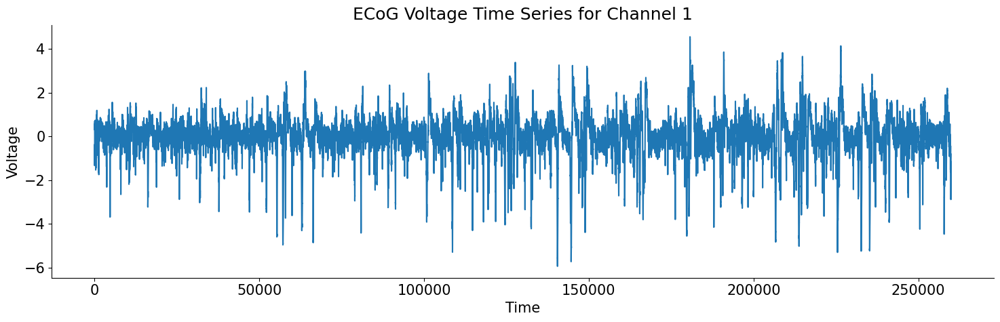

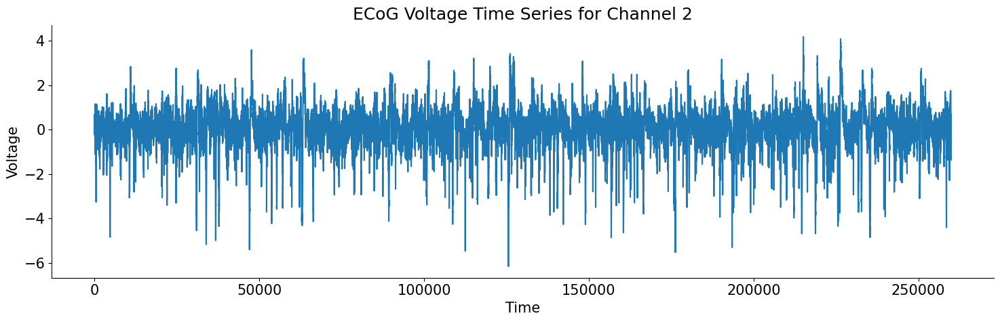

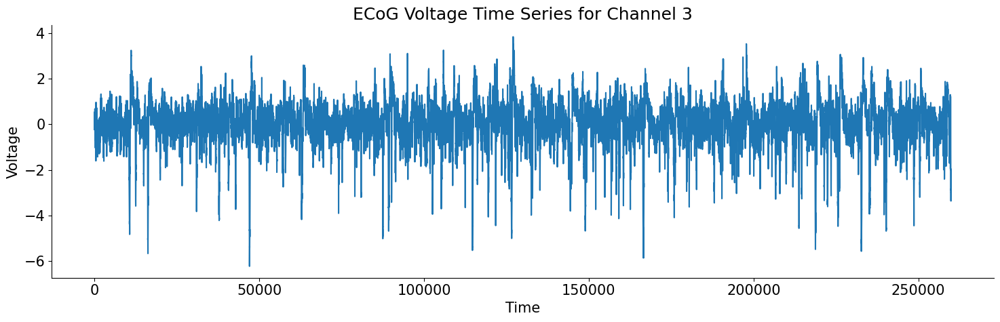

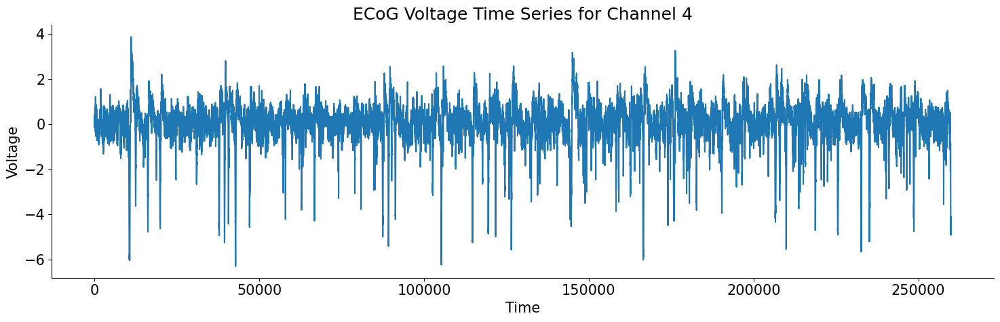

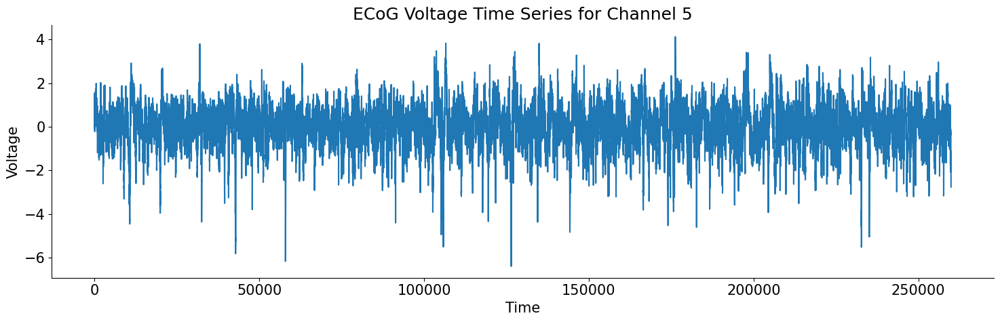

...

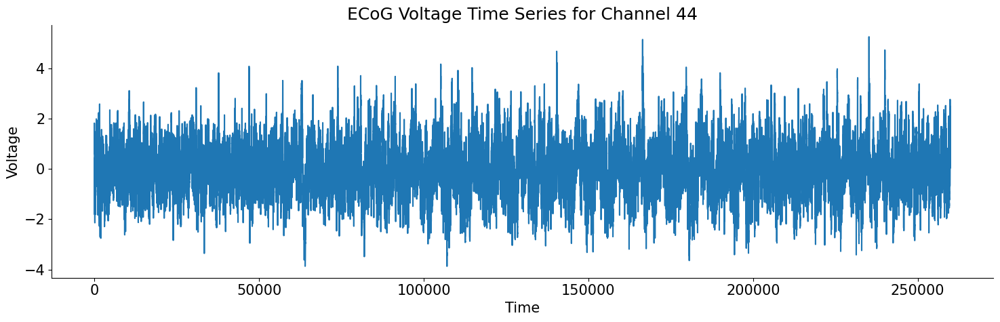

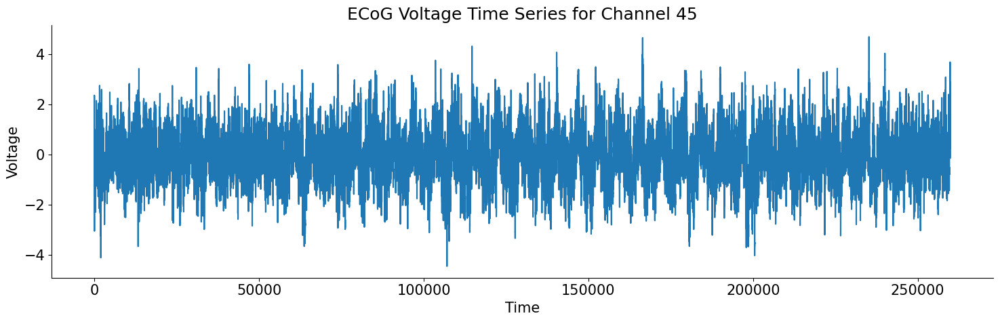

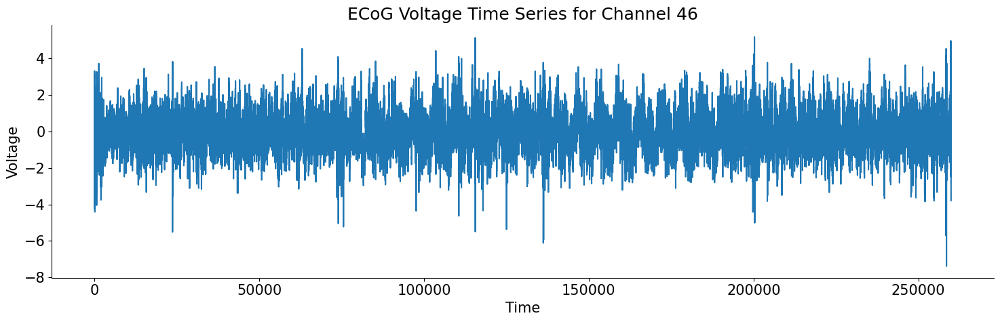

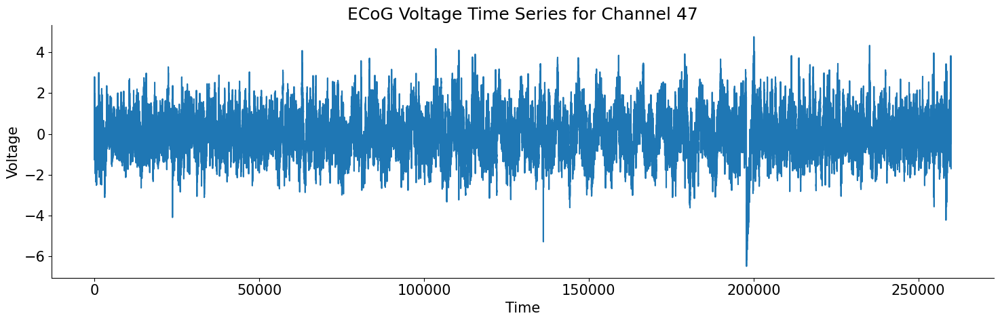

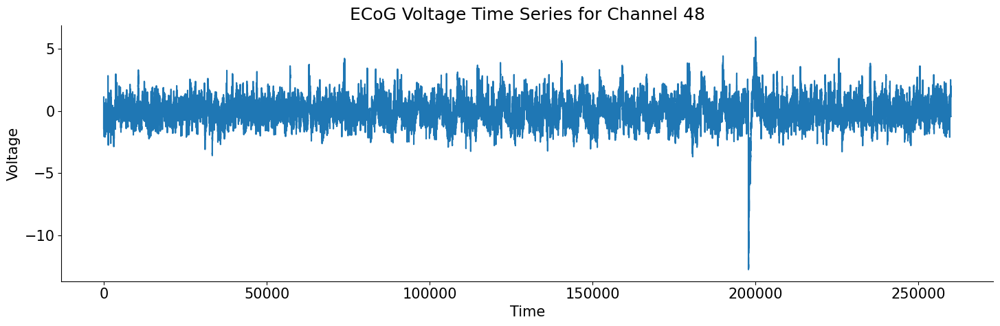

In [ ]:
# prompt: plot the voltage-time plot for each channel

import matplotlib.pyplot as plt
# Plot voltage-time for each channel individually
for i in range(dat['V'].shape[1]):
    plt.figure(figsize=(15, 5))
    plt.plot(dat['V'][:, i])
    plt.xlabel("Time")
    plt.ylabel("Voltage")
    plt.title(f"ECoG Voltage Time Series for Channel {i+1}")
    plt.show()


In [ ]:
# this one needs a lot more plots!
# for some reason, I only see meaningful correlations in subjects 2 and 3,
# but it's possible that there is spectral information that is more useful in those subjects

# Using MNE

In [ ]:
!pip install mne --quiet
import mne
# For elimiating warnings
from warnings import simplefilter
# ignore all future warnings
simplefilter(action='ignore', category=FutureWarning)

import mne.viz

In [ ]:
 dat=alldat[0] #data contains data for all 4 subjects




In [ ]:
subjID = 3 #@param {type:"number"}
print("Subjet Chosen:", subjID)

Subjet Chosen: 3


In [ ]:
subj = dat[subjID]
subj_name = str('subject '+ str(subjID))

V = subj['V'].astype('float32')
targetX = subj['targetX'].flatten()   # np array 1D
targetY = subj['targetY'].flatten()   # np array 1D
cursorX = subj['cursorX'].flatten()   # np array 1D
cursorY = subj['cursorY'].flatten()   # np array 1D
locs    = subj['locs']                # [[a1 b1 c1] [a2 b2 c2] ... [a60 b60 c60]]
hemisphere = subj['hemisphere']       # list of strings
lobe = subj['lobe']                   # ...
gyrus = subj['gyrus']                 # ...
Brodmann_Area = subj['Brodmann_Area'] # ...

In [ ]:
data = V.T
n_channels = V.shape[1]
sampling_freq = 1000  # in Hertz
ch_types = ['ecog']*n_channels
ch_names = ['chan'+str(channel) for channel in list(range(n_channels))]

info = mne.create_info(ch_names, sfreq=sampling_freq, ch_types='ecog', verbose=None)

raw = mne.io.RawArray(data, info)
print(raw.info)

Creating RawArray with float64 data, n_channels=48, n_times=259920
    Range : 0 ... 259919 =      0.000 ...   259.919 secs
Ready.
<Info | 7 non-empty values
 bads: []
 ch_names: chan0, chan1, chan2, chan3, chan4, chan5, chan6, chan7, chan8, ...
 chs: 48 ECoG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 500.0 Hz
 meas_date: unspecified
 nchan: 48
 projs: []
 sfreq: 1000.0 Hz
>


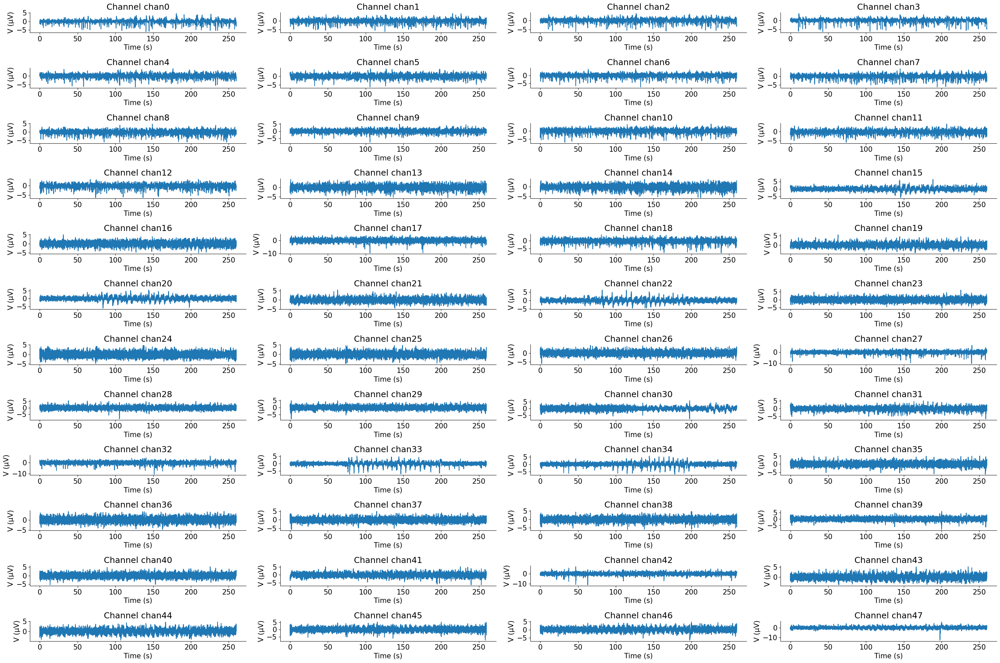

In [ ]:
# Select the channels you want to plot
picks = mne.pick_channels(raw.info['ch_names'], include=raw.info['ch_names'][:n_channels])  # Adjust to your channels

# Create a layout for 48 subplots
fig, axes = plt.subplots(12, 4, figsize=(30, 20))  # 12 rows, 4 columns

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plot each channel separately
for i, ch_name in enumerate(picks):
    ax = axes[i]
    data, times = raw[ch_name, :]
    ax.plot(times, data.T)
    ax.set_title(f'Channel {raw.info["ch_names"][ch_name]}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('V (µV)')

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [ ]:
data.shape

(1, 259920)

In [ ]:
def normalize(data, new_min, new_max):
    min_val = np.min(data)
    max_val = np.max(data)
    return (data - min_val) / (max_val - min_val) * (new_max - new_min) + new_min
data_normalized=_normalized=normalize(data, -1, 1)
cursorX_normalized = normalize(cursorX, -1, 1)
cursorY_normalized = normalize(cursorY, -1, 1)
targetX_normalized = normalize(targetX, -1, 1)
targetY_normalized = normalize(targetY, -1, 1)

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


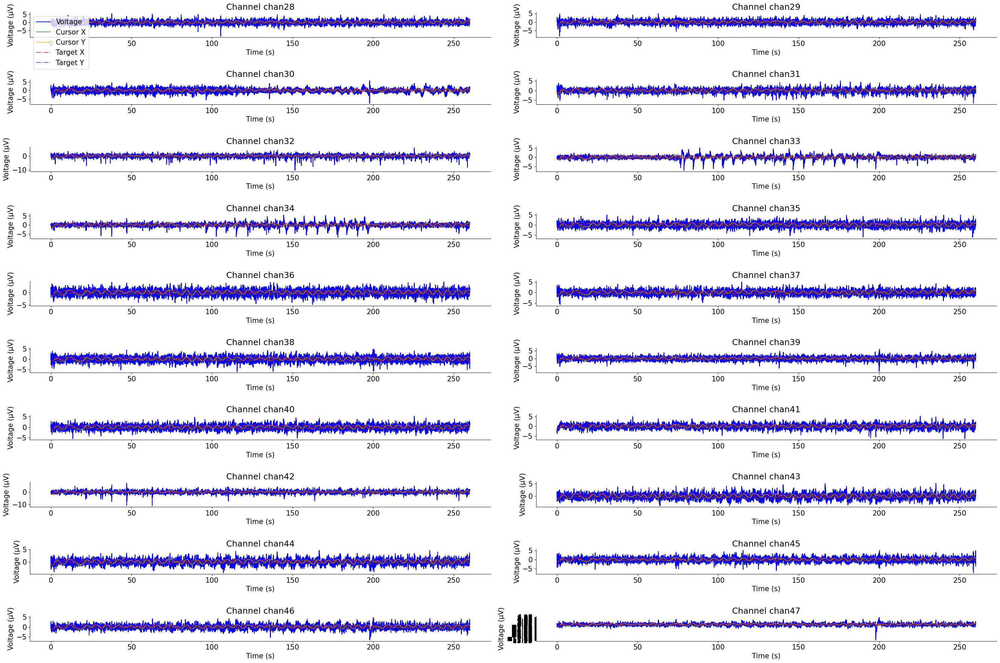

In [ ]:
# Select the 48 channels you want to plot
picks = mne.pick_channels(raw.info['ch_names'], include=raw.info['ch_names'][28:48])  # Adjust to your channels

# Create a layout for 48 subplots
fig, axes = plt.subplots(10, 2, figsize=(30, 20))  # 12 rows, 4 columns
# Flatten the axes array for easy iteration
axes = axes.flatten()

colors = {
    'Voltage': 'blue',
    'Cursor X': 'green',
    'Cursor Y': 'orange',
    'Target X': 'red',
    'Target Y': 'purple'
}

# Plot each channel separately with cursor and target data
for i, ch_name in enumerate(picks):
    ax = axes[i]
    data, times = raw[ch_name, :]
    ax.plot(times, data.T, label='Voltage', color=colors['Voltage'])
    ax.plot(times, cursorX_normalized, label='Cursor X', linestyle='-', alpha=0.7, color=colors['Cursor X'])
    ax.plot(times, cursorY_normalized, label='Cursor Y', linestyle='-', alpha=0.7, color=colors['Cursor Y'])
    ax.plot(times, targetX_normalized, label='Target X', linestyle='-.', alpha=0.7, color=colors['Target X'])
    ax.plot(times, targetY_normalized, label='Target Y', linestyle='-.', alpha=0.7, color=colors['Target Y'])
    ax.set_title(f'Channel {raw.info["ch_names"][ch_name]}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Voltage (µV)')


    if i == 0:  # Only add the legend to the first subplot for clarity
        ax.legend()

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.yticks(np.arange(data.min()-0.5, data.max()+0.5, 0.25))
plt.show()


In [ ]:
# @title Split the data in epochs -> each epoch one circle

In [ ]:
dat = alldat[0][3]

V = dat['V'].astype('float32')

nt, nchan = V.shape

targetX = dat['targetX'].flatten()
targetY = dat['targetY'].flatten()

In [ ]:
print(targetX.shape)
print(len(V))

(259920,)
259920


In [ ]:
# Function to detect the start of movement
def find_movement_start(targetX, targetY, threshold=1):
    for i in range(1, len(targetX)):

        if np.abs(targetX[i] - targetX[0]) > threshold or np.abs(targetY[i] - targetY[0]) > threshold:
            return i
    return 0  # Return 0 if no movement is detected

# Detect the start of movement
movement_start = find_movement_start(targetX, targetY)
print(movement_start)



2120


In [ ]:
targetX[2158:2164]

array([16383, 16383, 30384, 30384, 30384, 30384], dtype=uint16)

In [ ]:
# prompt: find how many times the value x[20] is repeating in the x and at what index

def find_repeating_value(x, value):
  indices = []
  count = 0
  for i in range(len(x)):
    if x[i] == value:
      count += 1
      indices.append(i)
  return count, indices

# Example usage:
value_to_find = targetX[80]  # Assuming you want to find the value at index 20

count, indices = find_repeating_value(targetX, value_to_find)
print(f"The value {value_to_find} repeats {count} times at indices: {indices}")


The value 0 repeats 2240 times at indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 2

In [ ]:
len(V)

259920

In [ ]:
# def find_non_consecutive_indices(arr):
#     indices = []
#     n = len(arr)

#     i = 0
#     while i < n:
#         if i < n - 1 and arr[i] == arr[i + 1]:  # If the current element is repeated
#             while i < n - 1 and arr[i] == arr[i + 1]:
#                 i += 1
#             indices.append(i)  # Append the last index of the repeated sequence
#         else:
#             indices.append(i)  # Append the index of non-repeated element
#         i += 1
#     filtered_arr=arr[indices]
#     return indices

# # Example usage:
# indices = find_non_consecutive_indices(targetX)
# print(f"Indices of elements or the last index of repeated elements: {indices}")



def find_non_consecutive_indices(arr):
    indices = []
    n = len(arr)

    i = 0
    while i < n:
        indices.append(i)  # Append the index of the first element in the sequence
        while i < n - 1 and arr[i] == arr[i + 1]:  # Skip the rest of the repeated elements
            i += 1
        i += 1

    return indices

# Example usage:

indices = find_non_consecutive_indices(targetY)
print(f"Indices of elements or the first index of repeated elements: {indices}")




Indices of elements or the first index of repeated elements: [0, 2120, 2160, 2200, 2240, 2280, 2320, 2360, 2400, 2440, 2480, 2520, 2560, 2600, 2640, 2680, 2720, 2760, 2800, 2840, 2880, 2920, 2960, 3000, 3040, 3080, 3120, 3160, 3200, 3240, 3280, 3320, 3360, 3400, 3440, 3480, 3520, 3560, 3600, 3640, 3680, 3720, 3760, 3800, 3840, 3880, 3920, 3960, 4000, 4040, 4080, 4120, 4160, 4200, 4240, 4280, 4320, 4360, 4400, 4440, 4480, 4520, 4560, 4600, 4640, 4680, 4720, 4760, 4800, 4840, 4880, 4920, 4960, 5000, 5040, 5080, 5120, 5160, 5200, 5240, 5280, 5320, 5360, 5400, 5440, 5480, 5520, 5560, 5600, 5640, 5680, 5720, 5760, 5800, 5840, 5880, 5920, 5960, 6000, 6040, 6080, 6120, 6160, 6200, 6240, 6280, 6320, 6360, 6400, 6440, 6480, 6520, 6560, 6600, 6640, 6680, 6720, 6760, 6800, 6840, 6880, 6920, 6960, 7000, 7040, 7080, 7120, 7160, 7200, 7240, 7280, 7320, 7360, 7400, 7440, 7480, 7520, 7560, 7600, 7640, 7680, 7720, 7760, 7800, 7840, 7880, 7920, 7960, 8000, 8040, 8080, 8120, 8160, 8200, 8240, 8280, 8320,

In [ ]:
len(indices)

6216

In [ ]:
filtered_targetX=targetX[indices]
filtered_targetY=targetY[indices]



In [ ]:
time_interest=[]

for i in range(len(filtered_targetY)):
  if(filtered_targetY[i]==targetY[2120]):
    time_interest.append(indices[i])


print(time_interest)

[2120, 13440, 75600, 137760, 199920]


In [ ]:
count=0
y_t=[]
for i in range(len(filtered_targetY)):
  if filtered_targetY[i]==np.max(filtered_targetY):
    count+=1
    y_t.append(indices[i])
    print(indices[i],count)

3720 1
15040 2
52760 3
59040 4
65320 5
71600 6
77200 7
114920 8
121200 9
127480 10
133760 11
139360 12
177080 13
183360 14
189640 15
195920 16
201520 17
239240 18
245520 19
251800 20
258080 21


In [ ]:
print(y_t)
print(np.diff(y_t))

[3720, 15040, 52760, 59040, 65320, 71600, 77200, 114920, 121200, 127480, 133760, 139360, 177080, 183360, 189640, 195920, 201520, 239240, 245520, 251800, 258080]
[11320 37720  6280  6280  6280  5600 37720  6280  6280  6280  5600 37720
  6280  6280  6280  5600 37720  6280  6280  6280]


In [ ]:
import numpy as np

def find_rotations(targetX, targetY, start_index=2120):
    start_point = (0, 0)
    rotations = []
    n = len(targetX)

    current_rotation_start = start_index
    rotation_count = 0

    for i in range(start_index, n):
        if (targetX[i], targetY[i]) == start_point:
            if rotation_count == 0:
                # Skip the initial point at the start index
                rotation_count += 1
                continue
            # End of a rotation
            current_rotation_end = i
            rotations.append((current_rotation_start, current_rotation_end))
            # Start of a new rotation
            current_rotation_start = i
            rotation_count += 1

    return rotation_count - 1, rotations

# Example usage:
dat = alldat[0][3]

V = dat['V'].astype('float32')

nt, nchan = V.shape

targetX = dat['targetX'].flatten()
targetY = dat['targetY'].flatten()

rotation_count, rotations = find_rotations(filtered_targetX, filtered_targetY)

print(f"Total number of rotations: {rotation_count}")
print(f"Indices of rotation starts and ends: {rotations}")


Total number of rotations: 1
Indices of rotation starts and ends: [(2120, 4714)]


In [ ]:
11320/2

5660.0

In [ ]:
print(targetX[13480])
print(targetY[13480])
print(np.max(targetX))
print(np.max(targetY))

30384
16384
30384
30383


num of sampled pts from sequences 13
num of sampled pts from sequences 26


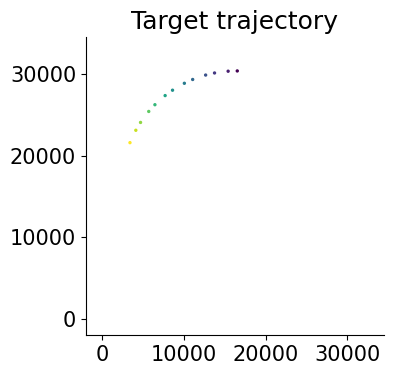

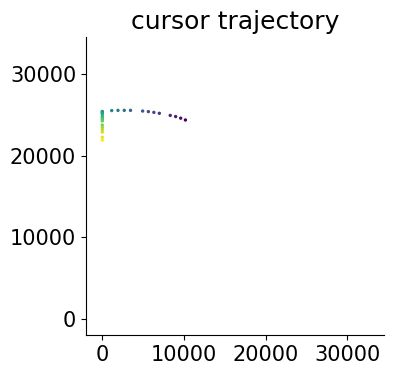

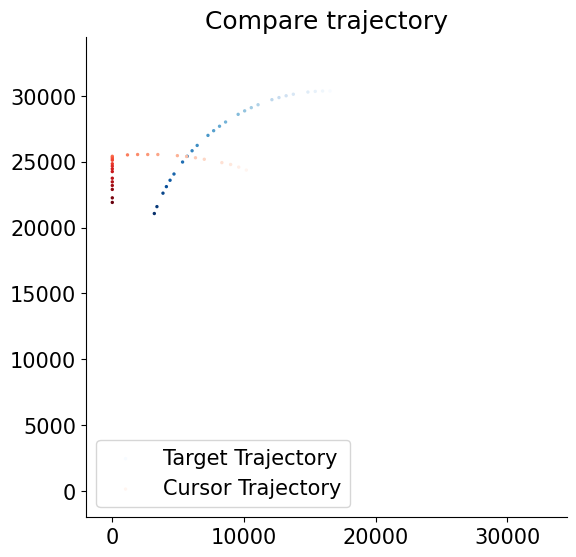

In [ ]:

start_point = 3720 # @param {type:"number"}
end_point = 5000 # @param {type:"number"}

xs_target = targetX[start_point:end_point]
ys_target = targetY[start_point:end_point]
plot_mvmt_trajectory(xs_target, ys_target, spacing_index=100, title = 'Target trajectory')

# xs_target = targetX[13480:19140]
# ys_target = targetY[13480:19140]
# plot_mvmt_trajectory(xs_target, ys_target, spacing_index=1, title = 'Target trajectory')


xs_cursor = cursorX[start_point:end_point]
ys_cursor = cursorY[start_point:end_point]
plot_mvmt_trajectory(xs_cursor, ys_cursor, spacing_index=50, title = 'cursor trajectory')


plot_mvmt_trajectories_compare(xs_target, ys_target, xs_cursor, ys_cursor, spacing_index=50, title = 'Compare trajectory')
